# Table of Contents
 <p><div class="lev1 toc-item"><a href="#Set-up-notebook" data-toc-modified-id="Set-up-notebook-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Set up notebook</a></div><div class="lev2 toc-item"><a href="#Import-libraries" data-toc-modified-id="Import-libraries-11"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Import libraries</a></div><div class="lev2 toc-item"><a href="#Plot-style" data-toc-modified-id="Plot-style-12"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Plot style</a></div><div class="lev1 toc-item"><a href="#Load-data" data-toc-modified-id="Load-data-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Load data</a></div><div class="lev1 toc-item"><a href="#Exploratory-data-analysis" data-toc-modified-id="Exploratory-data-analysis-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Exploratory data analysis</a></div><div class="lev2 toc-item"><a href="#Standardize-column-names" data-toc-modified-id="Standardize-column-names-31"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Standardize column names</a></div><div class="lev2 toc-item"><a href="#What's-in-each-dataset?" data-toc-modified-id="What's-in-each-dataset?-32"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>What's in each dataset?</a></div><div class="lev2 toc-item"><a href="#Looking-only-at-the-airports-that-appear-in-the-cancellations-dataset" data-toc-modified-id="Looking-only-at-the-airports-that-appear-in-the-cancellations-dataset-33"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>Looking only at the airports that appear in the cancellations dataset</a></div><div class="lev2 toc-item"><a href="#Visualizations" data-toc-modified-id="Visualizations-34"><span class="toc-item-num">3.4&nbsp;&nbsp;</span>Visualizations</a></div><div class="lev3 toc-item"><a href="#Correlations" data-toc-modified-id="Correlations-341"><span class="toc-item-num">3.4.1&nbsp;&nbsp;</span>Correlations</a></div><div class="lev3 toc-item"><a href="#Helper-function-for-swarm-plots" data-toc-modified-id="Helper-function-for-swarm-plots-342"><span class="toc-item-num">3.4.2&nbsp;&nbsp;</span>Helper function for swarm plots</a></div><div class="lev3 toc-item"><a href="#Distribution-of-data" data-toc-modified-id="Distribution-of-data-343"><span class="toc-item-num">3.4.3&nbsp;&nbsp;</span>Distribution of data</a></div><div class="lev4 toc-item"><a href="#By-year" data-toc-modified-id="By-year-3431"><span class="toc-item-num">3.4.3.1&nbsp;&nbsp;</span>By year</a></div><div class="lev4 toc-item"><a href="#By-FAA-region" data-toc-modified-id="By-FAA-region-3432"><span class="toc-item-num">3.4.3.2&nbsp;&nbsp;</span>By FAA region</a></div><div class="lev3 toc-item"><a href="#Plotting-latitude-and-longitude" data-toc-modified-id="Plotting-latitude-and-longitude-344"><span class="toc-item-num">3.4.4&nbsp;&nbsp;</span>Plotting latitude and longitude</a></div>

# Set up notebook

## Import libraries

In [1]:
import pandas as pd 
import numpy as np
import scipy
from sklearn import decomposition, manifold, preprocessing, cluster

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns

import psycopg2 as psy
import sqlalchemy

%matplotlib inline

## Plot style

In [2]:
plt.style.use("fivethirtyeight")

# Load data

In [3]:
airports = pd.read_csv("../assets/airports.csv")

In [4]:
cancellations = pd.read_csv("../assets/airport_cancellations.csv")

In [5]:
operations = pd.read_csv("../assets/Airport_operations.csv")

# Exploratory data analysis

In [6]:
airports.head(3)

,Key,LocID,AP_NAME,ALIAS,Facility Type,FAA REGION,COUNTY,CITY,STATE,AP Type,Latitude,Longitude,Boundary Data Available
0,3443.0,STX,HENRY E ROHLSEN,Henry E Rohlsen Int'l Airport,Airport,ASO,-VIRGIN ISLANDS-,CHRISTIANSTED,VI,Public Use,17.701556,-64.801722,Yes
1,5088.0,X64,PATILLAS,NaN,Airport,ASO,#NAME?,PATILLAS,PR,Public Use,17.982189,-66.019330,No
2,2886.0,PSE,MERCEDITA,Aeropuerto Mercedita,Airport,ASO,#NAME?,PONCE,PR,Public Use,18.008306,-66.563028,Yes


In [7]:
cancellations.head(3)

,Airport,Year,Departure Cancellations,Arrival Cancellations,Departure Diversions,Arrival Diversions
0,ABQ,2004.0,242.0,235.0,71.0,46.0
1,ABQ,2005.0,221.0,190.0,61.0,33.0
2,ABQ,2006.0,392.0,329.0,71.0,124.0


In [8]:
operations.head(3)

,airport,year,departures for metric computation,arrivals for metric computation,percent on-time gate departures,percent on-time airport departures,percent on-time gate arrivals,average_gate_departure_delay,average_taxi_out_time,average taxi out delay,average airport departure delay,average airborne delay,average taxi in delay,average block delay,average gate arrival delay
0,ABQ,2004,53971,53818,0.8030,0.7809,0.7921,10.38,9.89,2.43,12.10,2.46,0.83,2.55,10.87
1,ABQ,2005,51829,51877,0.8140,0.7922,0.8001,9.60,9.79,2.29,11.20,2.26,0.89,2.34,10.24
2,ABQ,2006,49682,51199,0.7983,0.7756,0.7746,10.84,9.89,2.16,12.33,2.12,0.84,2.66,11.82


## Standardize column names

In [9]:
airports.columns = [i.replace("_", " ").lower().replace(" ", "_") for i in airports.columns]
cancellations.columns = [i.replace("_", " ").lower().replace(" ", "_") for i in cancellations.columns]
operations.columns = [i.replace("_", " ").replace("-"," ").lower().replace(" ", "_") for i in operations.columns]

In [10]:
airports.head(3)

,key,locid,ap_name,alias,facility_type,faa_region,county,city,state,ap_type,latitude,longitude,boundary_data_available
0,3443.0,STX,HENRY E ROHLSEN,Henry E Rohlsen Int'l Airport,Airport,ASO,-VIRGIN ISLANDS-,CHRISTIANSTED,VI,Public Use,17.701556,-64.801722,Yes
1,5088.0,X64,PATILLAS,NaN,Airport,ASO,#NAME?,PATILLAS,PR,Public Use,17.982189,-66.019330,No
2,2886.0,PSE,MERCEDITA,Aeropuerto Mercedita,Airport,ASO,#NAME?,PONCE,PR,Public Use,18.008306,-66.563028,Yes


In [11]:
cancellations.head(3)

,airport,year,departure_cancellations,arrival_cancellations,departure_diversions,arrival_diversions
0,ABQ,2004.0,242.0,235.0,71.0,46.0
1,ABQ,2005.0,221.0,190.0,61.0,33.0
2,ABQ,2006.0,392.0,329.0,71.0,124.0


In [12]:
operations.head(3)

,airport,year,departures_for_metric_computation,arrivals_for_metric_computation,percent_on_time_gate_departures,percent_on_time_airport_departures,percent_on_time_gate_arrivals,average_gate_departure_delay,average_taxi_out_time,average_taxi_out_delay,average_airport_departure_delay,average_airborne_delay,average_taxi_in_delay,average_block_delay,average_gate_arrival_delay
0,ABQ,2004,53971,53818,0.8030,0.7809,0.7921,10.38,9.89,2.43,12.10,2.46,0.83,2.55,10.87
1,ABQ,2005,51829,51877,0.8140,0.7922,0.8001,9.60,9.79,2.29,11.20,2.26,0.89,2.34,10.24
2,ABQ,2006,49682,51199,0.7983,0.7756,0.7746,10.84,9.89,2.16,12.33,2.12,0.84,2.66,11.82


## What's in each dataset?

In [13]:
airports.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5167 entries, 0 to 5166
Data columns (total 13 columns):
key                        5164 non-null float64
locid                      5152 non-null object
ap_name                    5164 non-null object
alias                      3498 non-null object
facility_type              5164 non-null object
faa_region                 5164 non-null object
county                     5164 non-null object
city                       5164 non-null object
state                      5164 non-null object
ap_type                    5164 non-null object
latitude                   5164 non-null float64
longitude                  5164 non-null float64
boundary_data_available    5164 non-null object
dtypes: float64(3), object(10)
memory usage: 524.8+ KB


In [26]:
airports["locid"].nunique()

5152

In [14]:
cancellations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 805 entries, 0 to 804
Data columns (total 6 columns):
airport                    805 non-null object
year                       805 non-null float64
departure_cancellations    805 non-null float64
arrival_cancellations      805 non-null float64
departure_diversions       805 non-null float64
arrival_diversions         805 non-null float64
dtypes: float64(5), object(1)
memory usage: 37.8+ KB


In [27]:
cancellations["airport"].nunique()

74

In [15]:
operations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 841 entries, 0 to 840
Data columns (total 15 columns):
airport                               841 non-null object
year                                  841 non-null int64
departures_for_metric_computation     841 non-null int64
arrivals_for_metric_computation       841 non-null int64
percent_on_time_gate_departures       841 non-null float64
percent_on_time_airport_departures    841 non-null float64
percent_on_time_gate_arrivals         841 non-null float64
average_gate_departure_delay          841 non-null float64
average_taxi_out_time                 841 non-null float64
average_taxi_out_delay                841 non-null float64
average_airport_departure_delay       841 non-null float64
average_airborne_delay                841 non-null float64
average_taxi_in_delay                 841 non-null float64
average_block_delay                   841 non-null float64
average_gate_arrival_delay            841 non-null float64
dtypes: float64(1

In [28]:
operations["airport"].nunique()

77

Observations:

- There are a lot more instances in the airports dataset
- airports["locid"] maps to cancellations["airport"] and operations["airport"]
    - There are a lot more unique "locid"s than "airport"s

## Looking only at the airports that appear in the cancellations dataset

In [65]:
df = operations.merge(cancellations)
df = df.merge(airports, left_on="airport", right_on="locid")

In [66]:
df.head()

,airport,year,departures_for_metric_computation,arrivals_for_metric_computation,percent_on_time_gate_departures,percent_on_time_airport_departures,percent_on_time_gate_arrivals,average_gate_departure_delay,average_taxi_out_time,average_taxi_out_delay,...,alias,facility_type,faa_region,county,city,state,ap_type,latitude,longitude,boundary_data_available
0,ABQ,2004,53971,53818,0.8030,0.7809,0.7921,10.38,9.89,2.43,...,Albuquerque Int'l Sunport,Airport,ASW,BERNALILLO,ALBUQUERQUE,NM,Federalized/Commercial,35.040194,-106.609194,Yes
1,ABQ,2005,51829,51877,0.8140,0.7922,0.8001,9.60,9.79,2.29,...,Albuquerque Int'l Sunport,Airport,ASW,BERNALILLO,ALBUQUERQUE,NM,Federalized/Commercial,35.040194,-106.609194,Yes
2,ABQ,2006,49682,51199,0.7983,0.7756,0.7746,10.84,9.89,2.16,...,Albuquerque Int'l Sunport,Airport,ASW,BERNALILLO,ALBUQUERQUE,NM,Federalized/Commercial,35.040194,-106.609194,Yes
3,ABQ,2007,53255,53611,0.8005,0.7704,0.7647,11.29,10.34,2.40,...,Albuquerque Int'l Sunport,Airport,ASW,BERNALILLO,ALBUQUERQUE,NM,Federalized/Commercial,35.040194,-106.609194,Yes
4,ABQ,2008,49589,49512,0.8103,0.7844,0.7875,10.79,10.41,2.41,...,Albuquerque Int'l Sunport,Airport,ASW,BERNALILLO,ALBUQUERQUE,NM,Federalized/Commercial,35.040194,-106.609194,Yes


In [68]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 799 entries, 0 to 798
Data columns (total 32 columns):
airport                               799 non-null object
year                                  799 non-null int64
departures_for_metric_computation     799 non-null int64
arrivals_for_metric_computation       799 non-null int64
percent_on_time_gate_departures       799 non-null float64
percent_on_time_airport_departures    799 non-null float64
percent_on_time_gate_arrivals         799 non-null float64
average_gate_departure_delay          799 non-null float64
average_taxi_out_time                 799 non-null float64
average_taxi_out_delay                799 non-null float64
average_airport_departure_delay       799 non-null float64
average_airborne_delay                799 non-null float64
average_taxi_in_delay                 799 non-null float64
average_block_delay                   799 non-null float64
average_gate_arrival_delay            799 non-null float64
departure_cancell

In [70]:
df.describe(include=["O"])

,airport,locid,ap_name,alias,facility_type,faa_region,county,city,state,ap_type,boundary_data_available
count,799,799,799,799,799,799,799,799,799,799,799
unique,74,74,74,74,1,9,63,69,36,2,1
top,LAS,LAS,THEODORE FRANCIS GREEN STATE,Honolulu Int'l Airport,Airport,AWP,ORANGE,NEW YORK,CA,Federalized/Commercial,Yes
freq,11,11,11,11,799,177,33,33,122,748,799


In [71]:
# Remove "duplicate" columns
del df["key"]
del df["locid"]

# Remove columns that may not be useful
del df["ap_name"]
del df["alias"]
del df["facility_type"]
del df["county"]
del df["city"]
del df["boundary_data_available"]

In [72]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 799 entries, 0 to 798
Data columns (total 24 columns):
airport                               799 non-null object
year                                  799 non-null int64
departures_for_metric_computation     799 non-null int64
arrivals_for_metric_computation       799 non-null int64
percent_on_time_gate_departures       799 non-null float64
percent_on_time_airport_departures    799 non-null float64
percent_on_time_gate_arrivals         799 non-null float64
average_gate_departure_delay          799 non-null float64
average_taxi_out_time                 799 non-null float64
average_taxi_out_delay                799 non-null float64
average_airport_departure_delay       799 non-null float64
average_airborne_delay                799 non-null float64
average_taxi_in_delay                 799 non-null float64
average_block_delay                   799 non-null float64
average_gate_arrival_delay            799 non-null float64
departure_cancell

In [105]:
df.to_csv("combined_data.csv")

## Visualizations

### Correlations

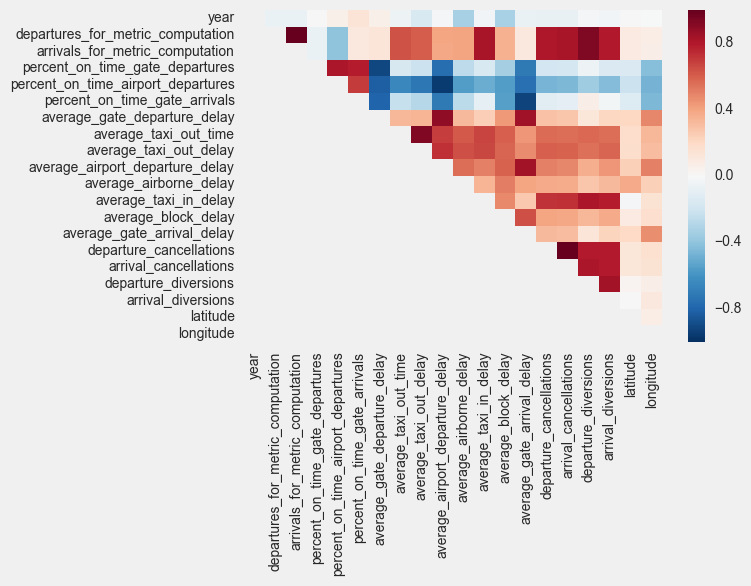

In [80]:
# Create a mask so that only one half of our heatmap shows up
# This takes out duplicates in the grid and also the spots where a variable is being compared to itself
mask = np.zeros_like(df.corr(), dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(df.corr(), mask=mask.T);

Observations:

- Cancellations and diversions are highly correlated
- Percentage of on time gate departures, airport departures, gate arrivals, average departure delay, and average arrival delay are highly correlated (both positively and negatively)
- Average taxi out time and taxi out delay has medium correlation with other delays as well as cancellations and diversions
- Average taxi in time has high correlation with cancellations and diversions

In [73]:
sns.pairplot(df[[i for i in df.columns if "average" in i or "percent" in i or "cancel" in i or "diver" in i]],
             size=5);
plt.xticks(fontsize=5);

### Helper function for swarm plots

In [83]:
def plot_swarm(x, y, hue, data, xlab=None, ylab=None, title=None):
    plt.subplots(figsize=(16,8));
    ax = sns.swarmplot(x=x, y=y, hue=hue, data=data);
    plt.xticks(fontsize=15);
    plt.yticks(fontsize=15);
    if ylab is not None:
        plt.ylabel(ylab, fontsize=20);
    if xlab is not None:
        plt.xlabel(xlab, fontsize=20);
    if title is not None:
        plt.title(title);

### Distribution of data

#### By year

In [98]:
plot_cols = list(df.columns)[4:-5]
plot_cols

['percent_on_time_gate_departures',
 'percent_on_time_airport_departures',
 'percent_on_time_gate_arrivals',
 'average_gate_departure_delay',
 'average_taxi_out_time',
 'average_taxi_out_delay',
 'average_airport_departure_delay',
 'average_airborne_delay',
 'average_taxi_in_delay',
 'average_block_delay',
 'average_gate_arrival_delay',
 'departure_cancellations',
 'arrival_cancellations',
 'departure_diversions',
 'arrival_diversions']

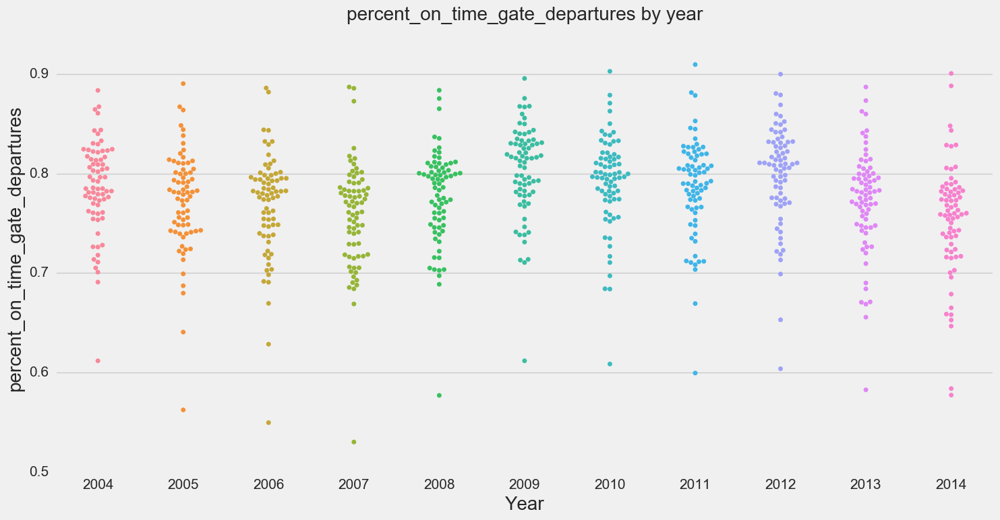

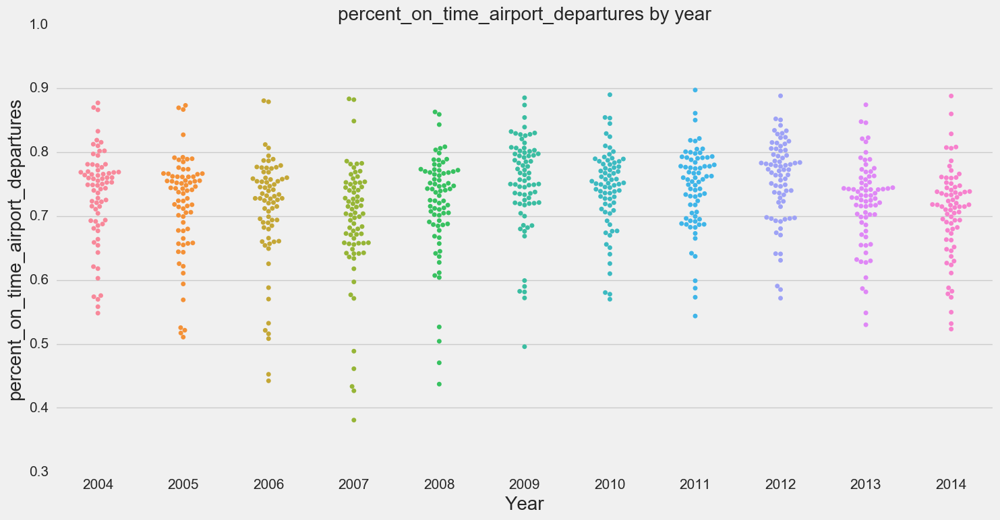

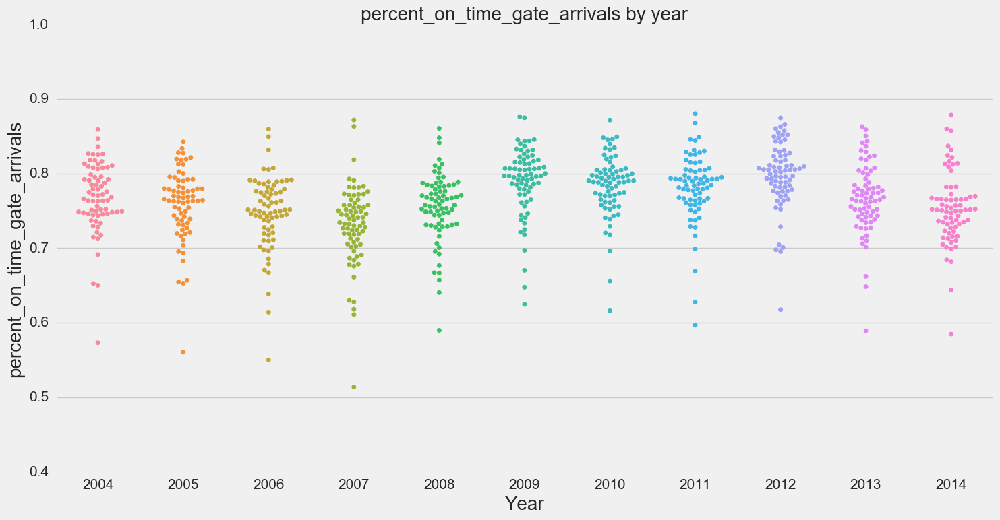

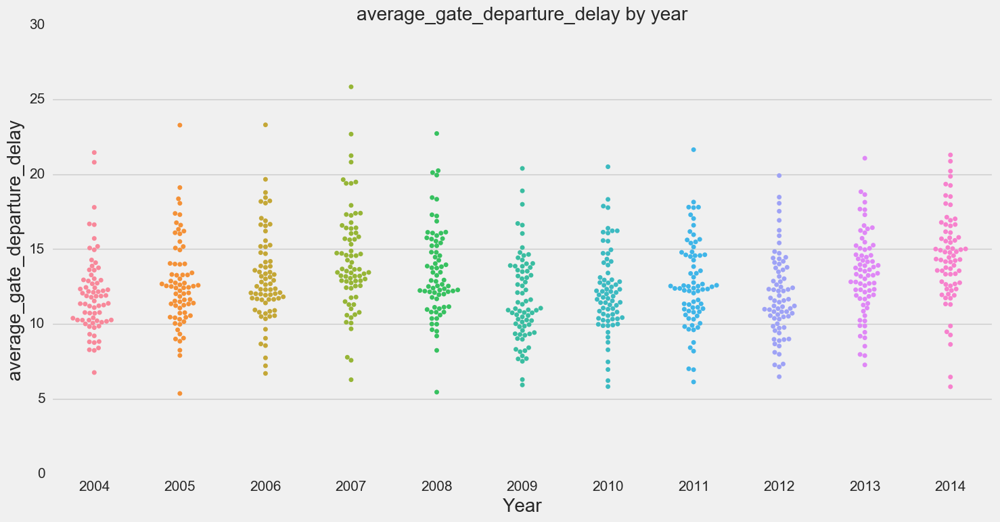

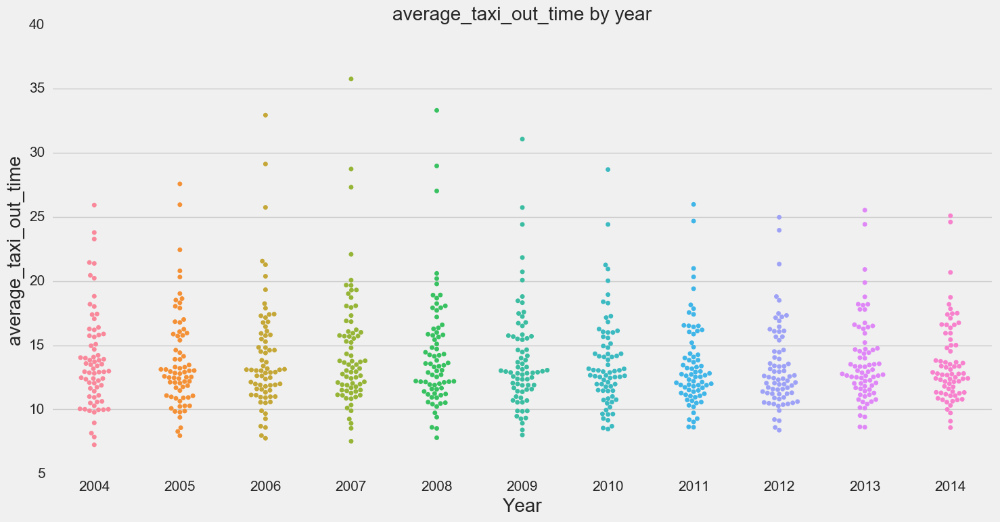

...

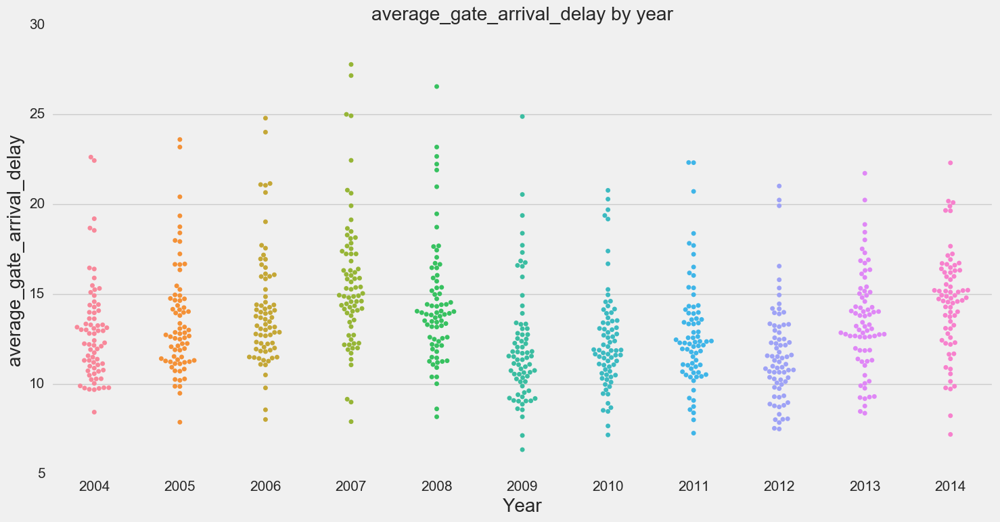

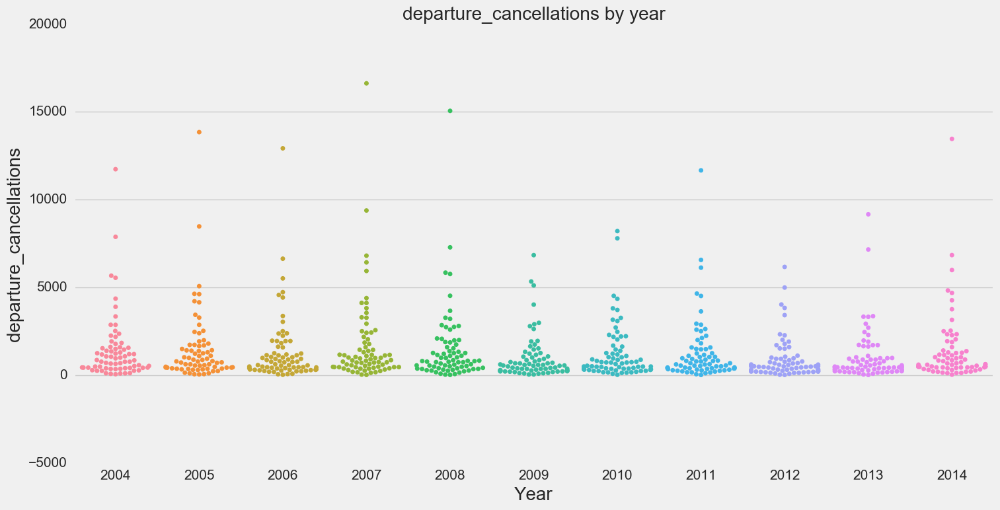

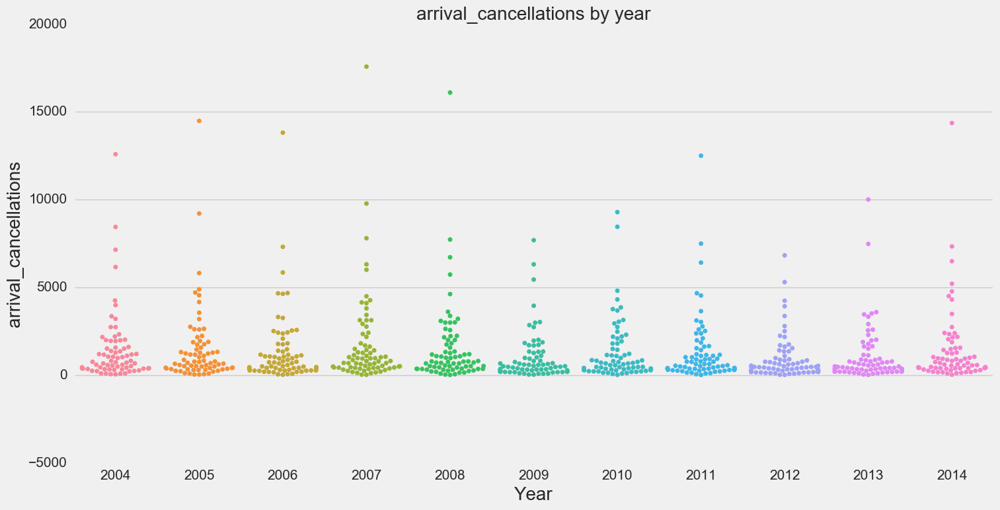

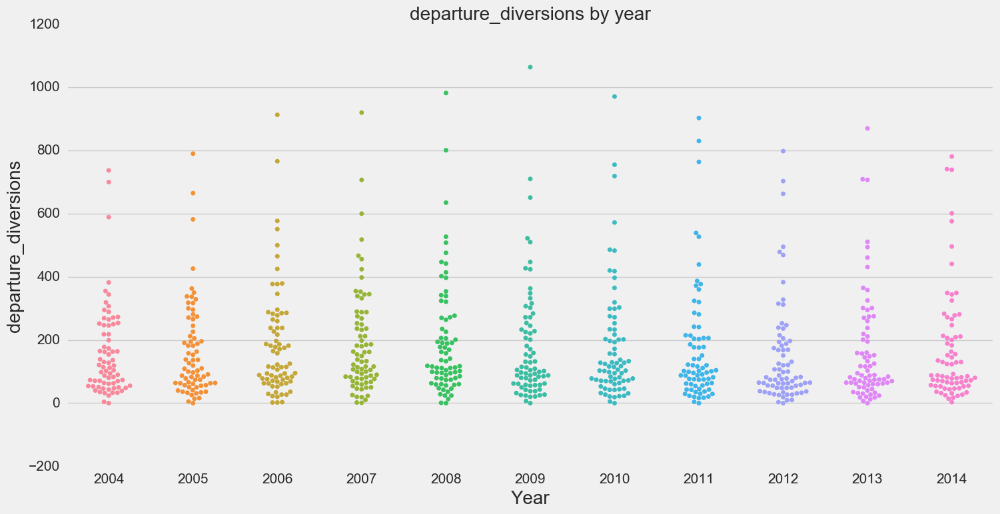

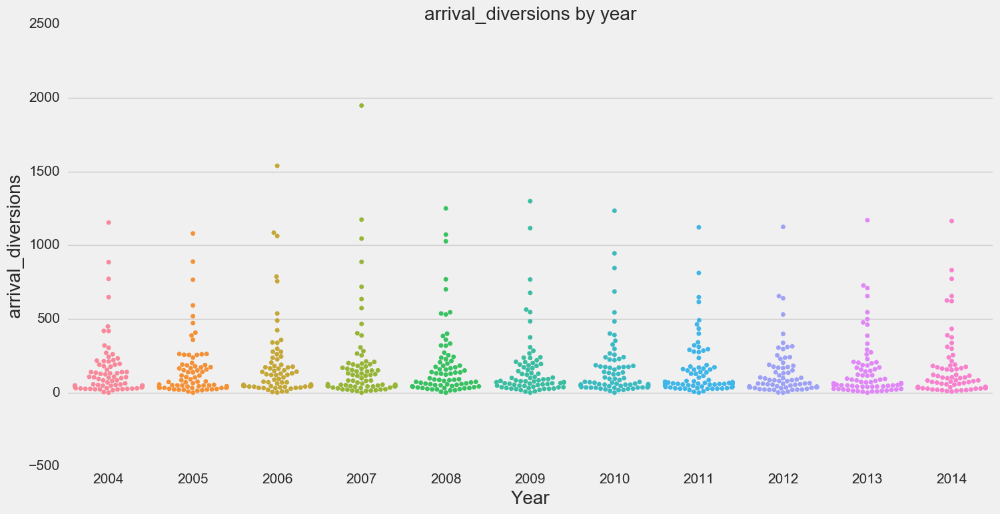

In [99]:
for i in plot_cols:
    plot_swarm("year", i, hue=None, data=df, xlab="Year",
           ylab=i, title= i + " by year")

Observations:

- No apparent pattern visible by year except for block delay and gate arrival delay

#### By FAA region

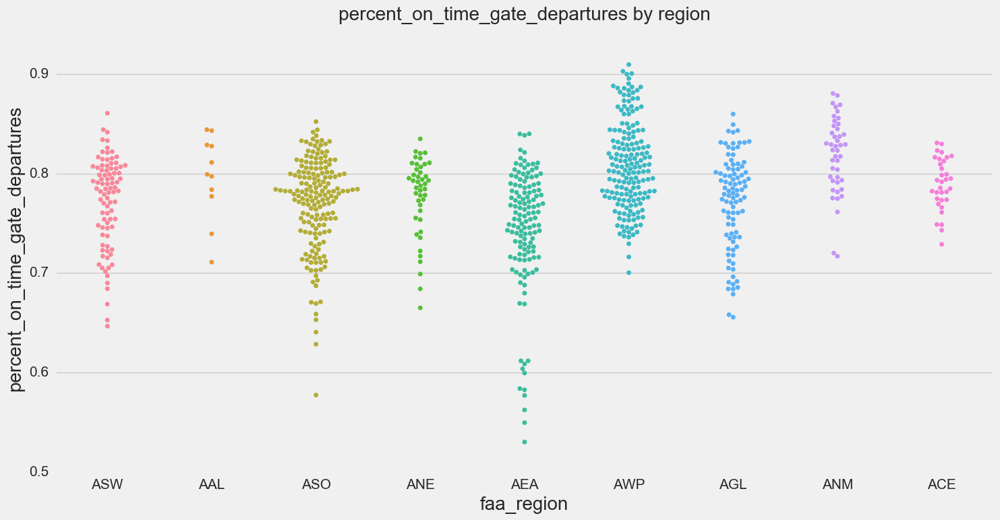

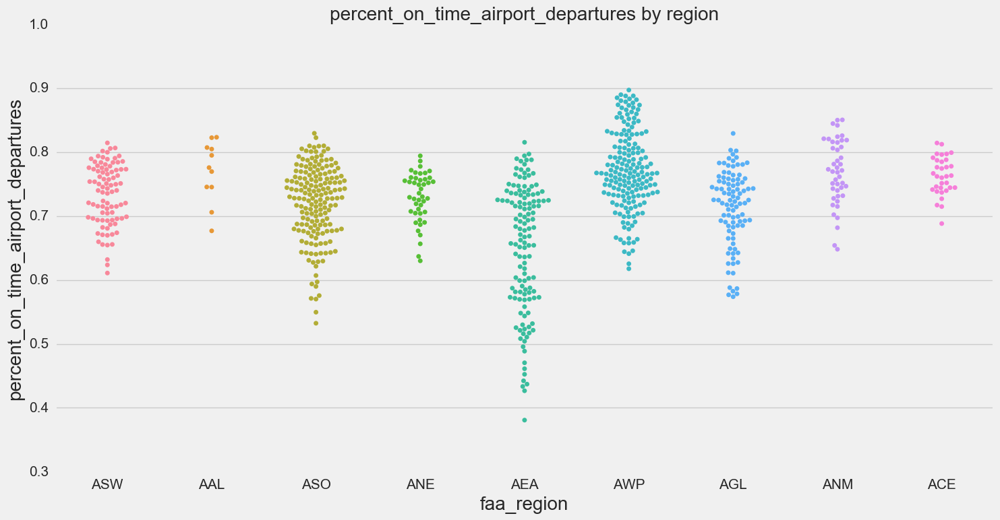

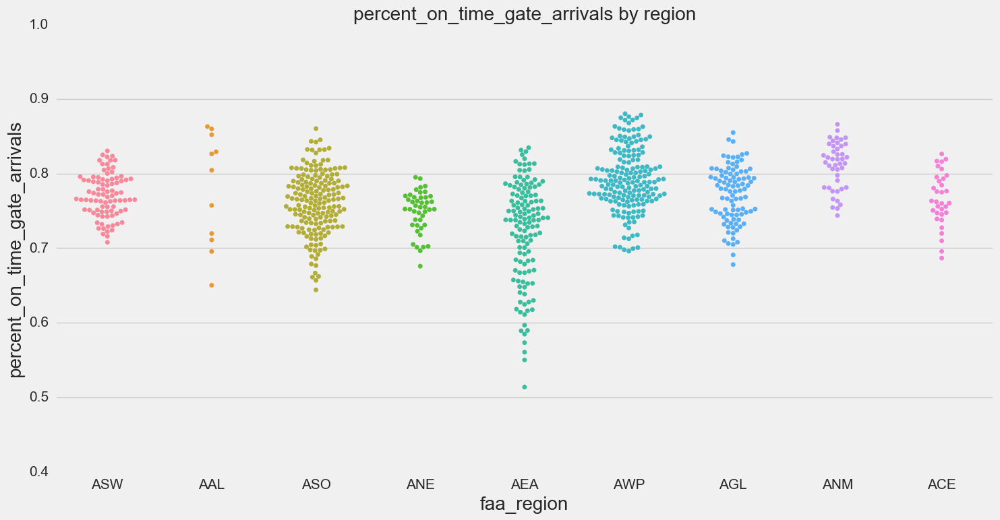

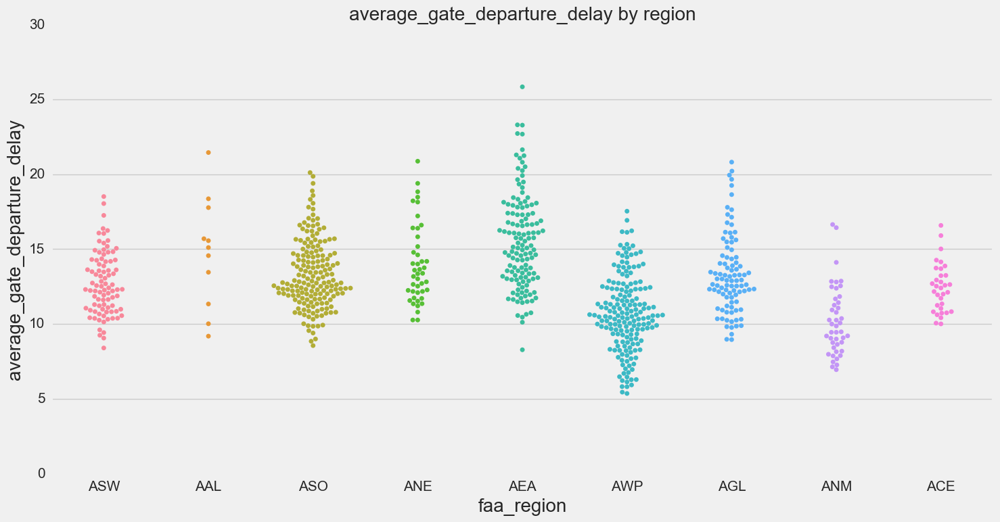

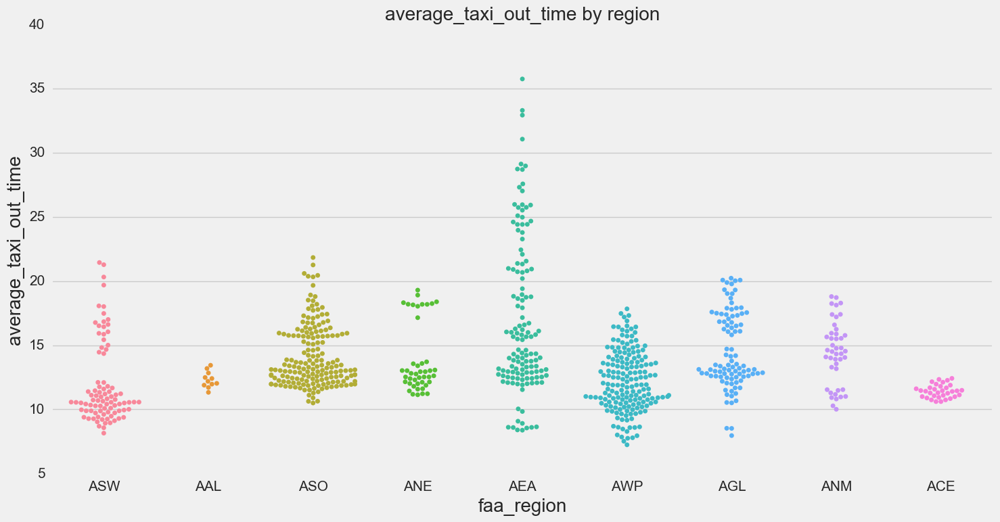

...

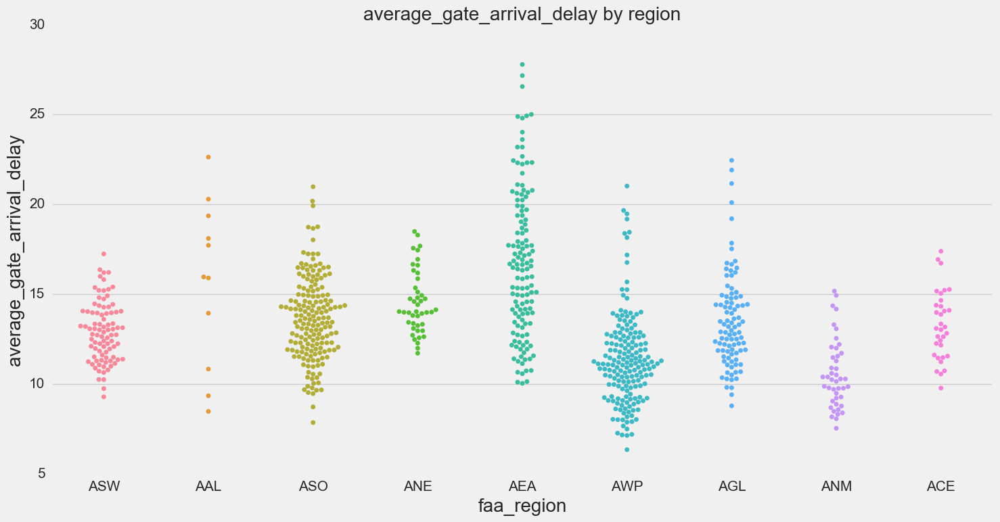

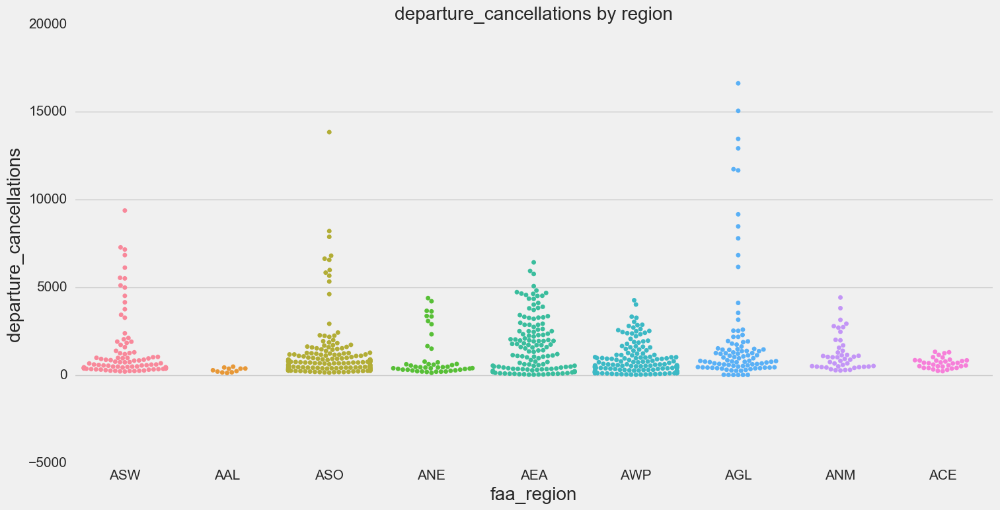

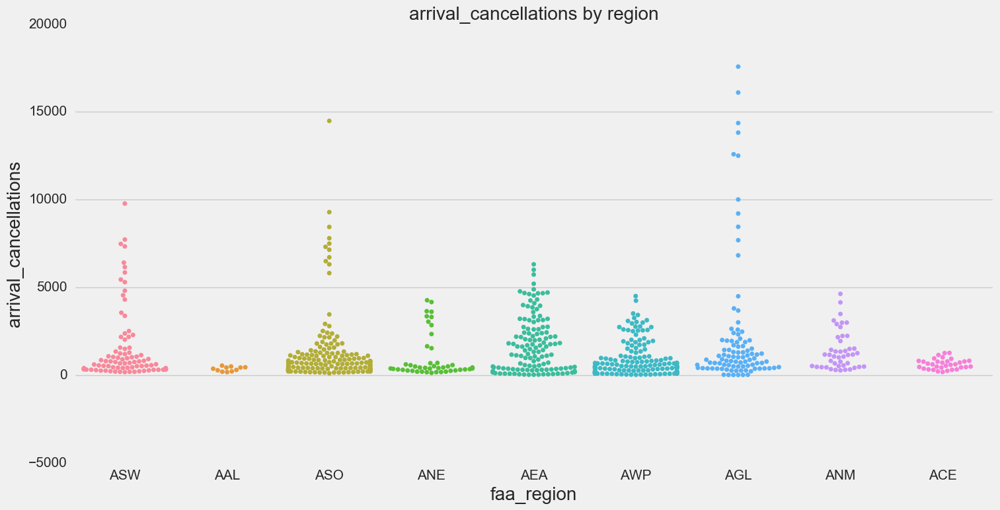

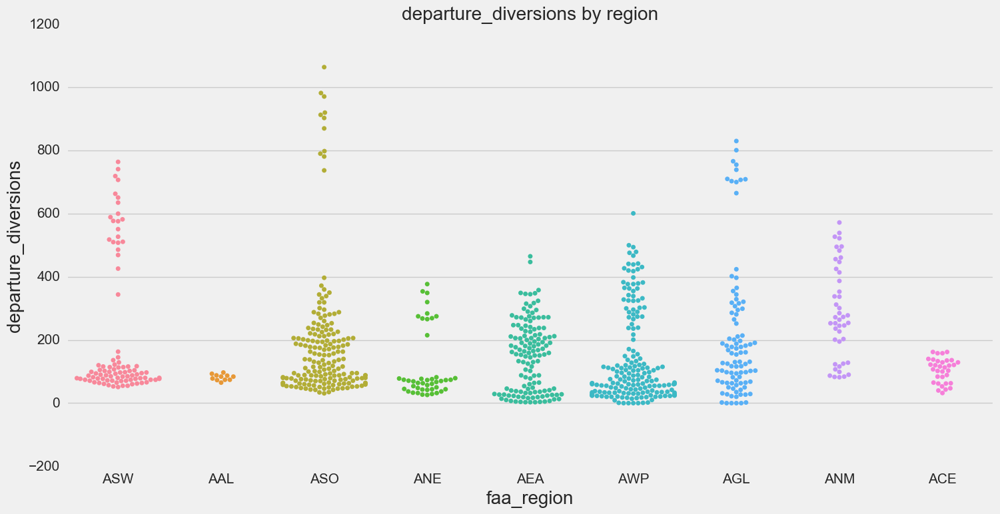

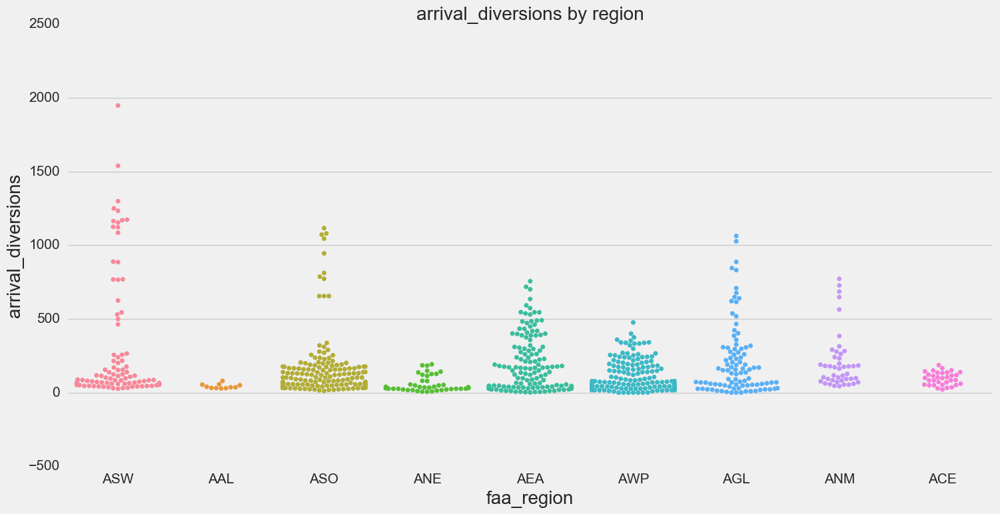

In [100]:
for i in plot_cols:
    plot_swarm("faa_region", i, hue=None, data=df, xlab="faa_region",
           ylab=i, title= i + " by region")

Observations:

- Swarm plot shows that certain regions have higher delays (AEA - Eastern)

### Plotting latitude and longitude

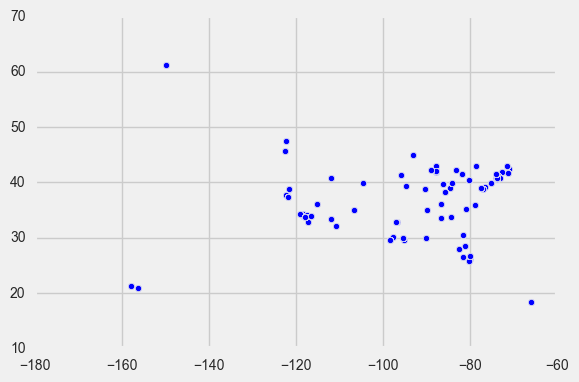

In [104]:
plt.scatter("longitude", "latitude", data=df)